In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df = pd.read_csv('../../data/kc_house_data.csv')

In [3]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,6 Low Average,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,7 Average,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,8 Good,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [5]:
# Below code unnecessary 
# df['geometry'] = list(zip(df.lat, df.long))

In [8]:
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.long, df.lat))

In [11]:
gdf.crs

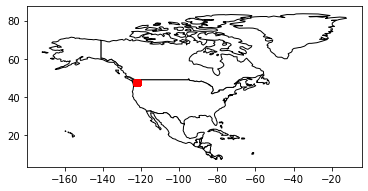

In [14]:
#QUICK TEST PLOT 

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# We restrict to North America.
ax = world[world.continent == 'North America'].plot(
    color='white', edgecolor='black')

# We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax, color='red')

plt.show()

In [32]:
gdf.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,geometry
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,POINT (-122.25700 47.51120)
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,POINT (-122.31900 47.72100)
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062,POINT (-122.23300 47.73790)
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,POINT (-122.39300 47.52080)
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,POINT (-122.04500 47.61680)


In [16]:
police_gdf = gpd.read_file('GIS_data/Police_Station_Locations_in_King_County___kcp_loc_point.shp')
police_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [18]:
gdf.crs = "EPSG:4326"

In [19]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [20]:
import folium

In [23]:
x = 0



In [47]:
### Mapping out police stations (blue) compared to house locations (white) 

m = folium.Map([47.452936, -121.850514], tiles='CartoDb dark_matter')

locs_police = [(x,y) for x,y in zip(police_gdf['geometry'].y, police_gdf['geometry'].x)]

locs_houses = [(x,y) for x,y in zip(gdf['geometry'].y, gdf['geometry'].x)]


for location in locs_houses:
    folium.CircleMarker(location = location, color = 'white', radius = .5).add_to(m)

for location in locs_police:
    folium.CircleMarker(location = location, color='blue', radius=4 ).add_to(m)
    

m

In [42]:
from scipy.spatial import cKDTree
from shapely.geometry import Point

In [56]:
def ckdnearest(gdA, gdB, name):
    
    nA = np.array(list(gdA.geometry.apply(lambda x: (x.x, x.y))))
    nB = np.array(list(gdB.geometry.apply(lambda x: (x.x, x.y))))
    btree = cKDTree(nB)
    
    dist, idx = btree.query(nA, k=1)
    
    gdB_nearest = gdB.iloc[idx].drop(columns='geometry').reset_index(drop=True)
    gdf = pd.concat(
        [
            gdA.reset_index(drop=True),
            gdB_nearest[name],
            pd.Series(dist, name='dist')
        ],
        axis = 1)
    
    return gdf

In [57]:
#get nearest geometry
updated_gdf = ckdnearest(gdf, police_gdf, 'NAME')

In [58]:
updated_gdf.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,geometry,NAME,dist
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,1955,0.0,98178,47.5112,-122.257,1340,5650,POINT (-122.25700 47.51120),West Hill Storefront,0.027330
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,1951,1991.0,98125,47.7210,-122.319,1690,7639,POINT (-122.31900 47.72100),Seattle Police North Precinct,0.023986
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,1933,NaN,98028,47.7379,-122.233,2720,8062,POINT (-122.23300 47.73790),Kenmore Police Department,0.027925
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,1965,0.0,98136,47.5208,-122.393,1360,5000,POINT (-122.39300 47.52080),Seattle Police Southwest Precinct,0.034575
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,1987,0.0,98074,47.6168,-122.045,1800,7503,POINT (-122.04500 47.61680),Sammamish Police Department,0.017513


In [49]:
updated_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 42 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   id             21597 non-null  int64   
 1   date           21597 non-null  object  
 2   price          21597 non-null  float64 
 3   bedrooms       21597 non-null  int64   
 4   bathrooms      21597 non-null  float64 
 5   sqft_living    21597 non-null  int64   
 6   sqft_lot       21597 non-null  int64   
 7   floors         21597 non-null  float64 
 8   waterfront     19221 non-null  object  
 9   view           21534 non-null  object  
 10  condition      21597 non-null  object  
 11  grade          21597 non-null  object  
 12  sqft_above     21597 non-null  int64   
 13  sqft_basement  21597 non-null  object  
 14  yr_built       21597 non-null  int64   
 15  yr_renovated   17755 non-null  float64 
 16  zipcode        21597 non-null  int64   
 17  lat            21597 no

In [51]:
updated_gdf['STATE_NAME'].value_counts()

WA    21597
Name: STATE_NAME, dtype: int64